# protostars
## 04- `Star_BB.py` experiment 2
### I. Examine the MCMC output

We have successfully run `Starfish` with the `Star_BB.py` code.

In [1]:
import pandas as pd

In [2]:
ws = np.load("../sf/exp2/output/veil1/run02/emcee_chain.npy")

In [3]:
burned = ws[:, -1000:,:]
xs, ys, zs = burned.shape
fc = burned.reshape(xs*ys, zs)
nx, ny = fc.shape

In [4]:
from matplotlib.ticker import MaxNLocator

In [5]:
label = [r"$T_{\mathrm{eff}}$", r"$\log{g}$", r"$[\mathrm{Fe}/\mathrm{H}]$",r"$v_z$", r"$v\sin{i}$", r"$\log{\Omega}$", 
         r"$T_{\mathrm{BB}}$", r"$\log{\Omega_2}$", r"$c^1$", r"$c^2$", r"$c^3$", r"sigAmp", r"logAmp", r"$l$"] 

In [6]:
ws.shape

(40, 5000, 14)

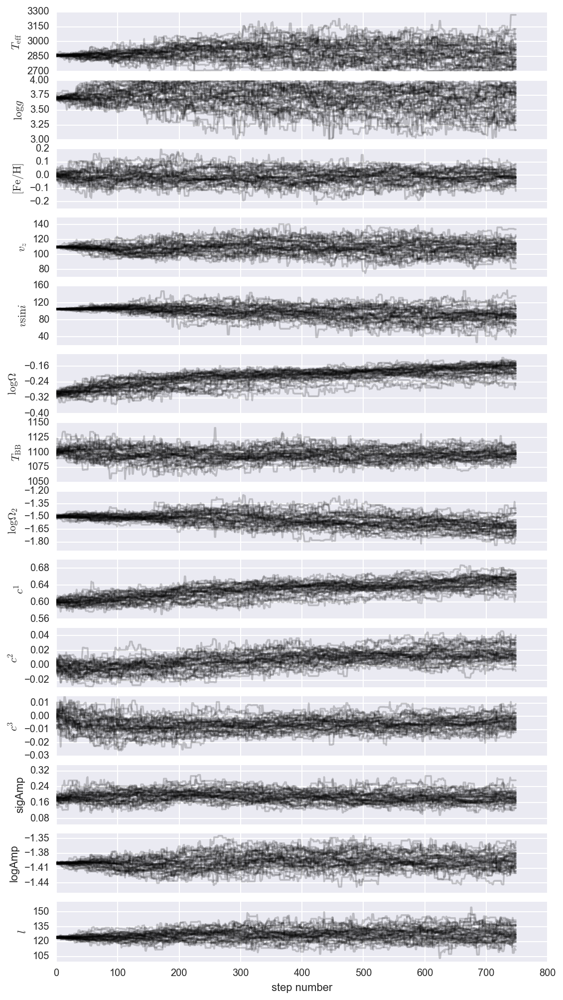

In [7]:
fig, axes = plt.subplots(14, 1, sharex=True, figsize=(8, 14))
for i in range(0, 14, 1):
    axes[i].plot(ws[:, :749, i].T, color="k", alpha=0.2)
    axes[i].yaxis.set_major_locator(MaxNLocator(5))
    axes[i].set_ylabel(label[i])

axes[13].set_xlabel("step number")
fig.tight_layout(h_pad=0.0)

Looks good.  I started with a good guess.

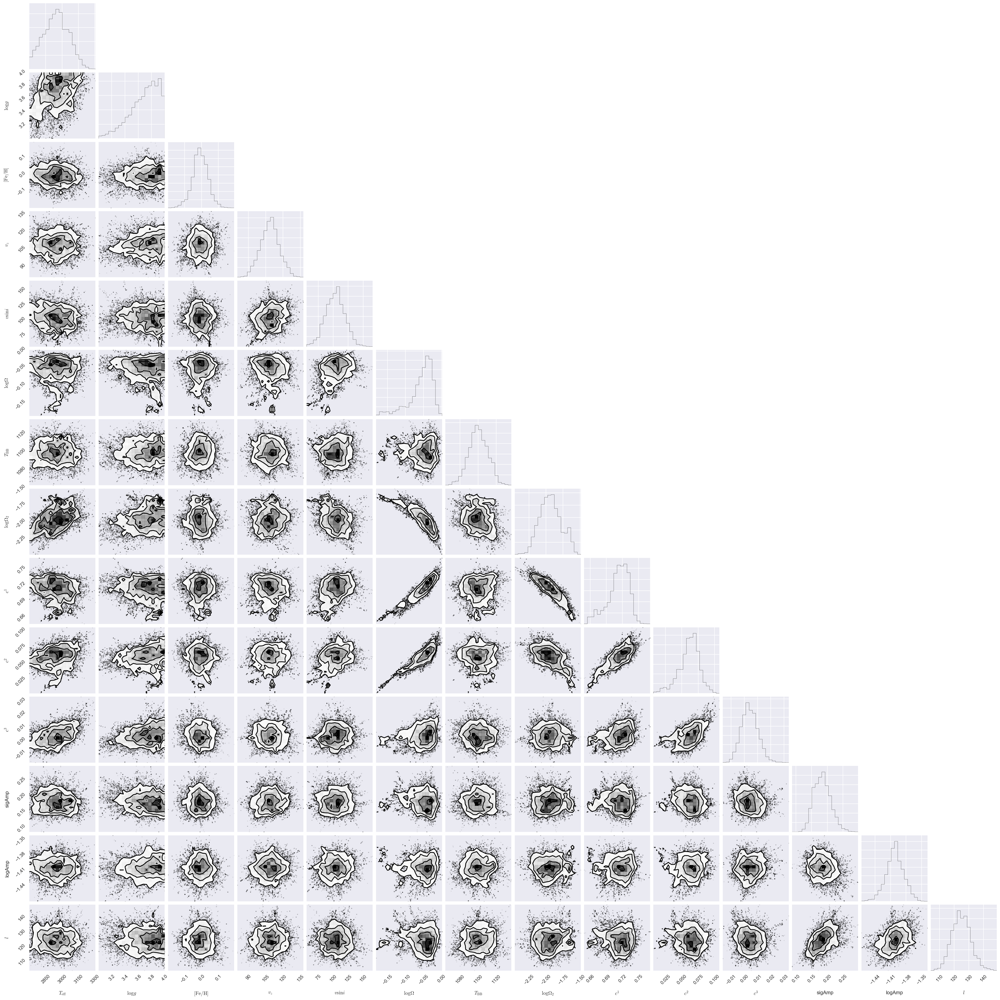

In [8]:
import corner
fig = corner.corner(fc, labels=label)
fig.savefig('../plots/14_parameter_corner.png', dpi=300)

In [9]:
draws = pd.read_csv('../sf/exp1/output/veil1/run01/models_ff-05_50_95.csv')

In [10]:
sns.set_context('paper')

In [11]:
raw_mods = np.load('../sf/exp2/output/veil1/run02/temp_raw_models.npy')

In [12]:
n_samples, n_walkers, _, _ =raw_mods.shape

In [13]:
star, disk = raw_mods[4999, 0, 0, :], raw_mods[4999, 0, 1, :]

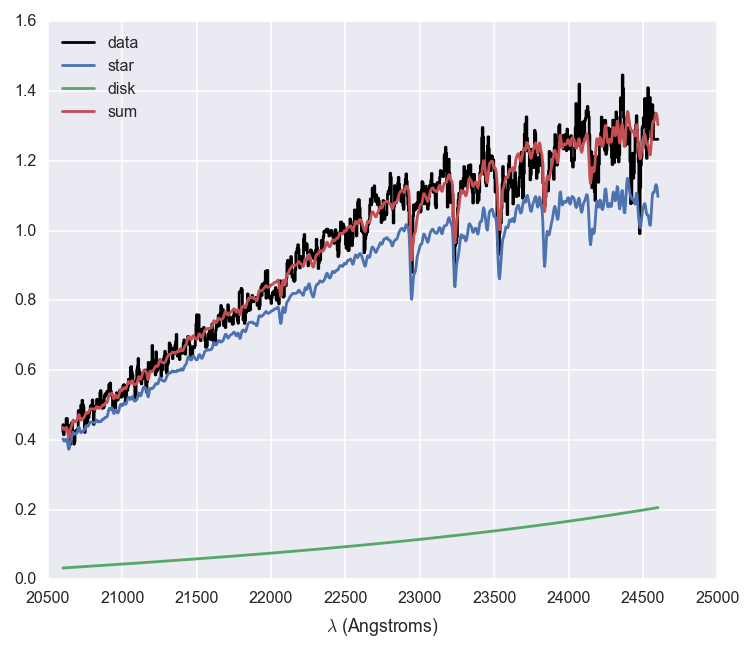

In [14]:
plt.figure(figsize=(6, 5))
plt.step(draws.wl, draws.data, 'k')
plt.plot(draws.wl, star, label = 'star')
plt.plot(draws.wl, disk, label = 'disk')
plt.plot(draws.wl, star+disk, label = 'sum')
plt.xlabel('$\lambda$ (Angstroms)')
plt.ylim(0,1.6)
plt.legend(loc='best')

In [15]:
n_samples

5000

### Animation

In [16]:
from matplotlib import animation

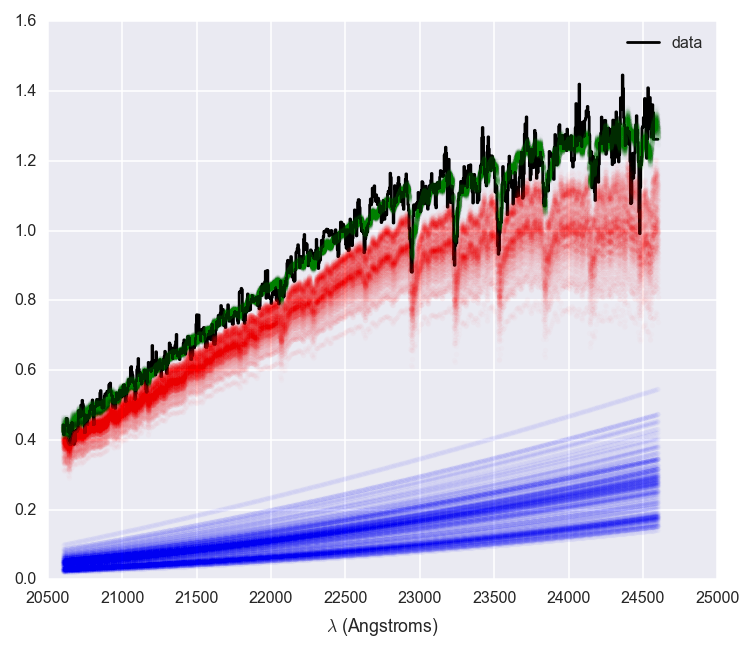

In [17]:
plt.figure(figsize=(6, 5))
plt.step(draws.wl, draws.data, 'k')


for i in range(4900, 4999):
    j = np.random.randint(0,40)
    star, disk = raw_mods[i, j, 0, :], raw_mods[i, j, 1, :]
    plt.plot(draws.wl, star, 'r.', alpha=0.01)
    plt.plot(draws.wl, disk, 'b.', alpha=0.01)
    plt.plot(draws.wl, star+disk, 'g.', alpha=0.01)
    plt.xlabel('$\lambda$ (Angstroms)')
    plt.ylim(0,1.6)
    plt.legend(loc='best')

In [18]:
n_frames = 1000

In [19]:
sns.set_style('ticks')

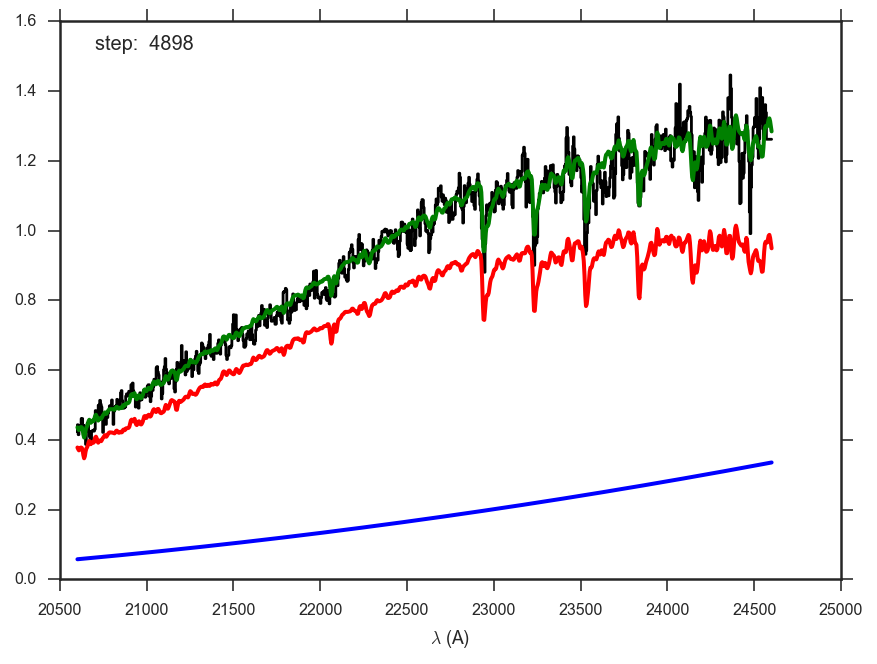

In [20]:
fig = plt.figure(figsize=(7, 5))
ax = plt.axes()

plt.ylim(0, 1.6)
plt.step(draws.wl, draws.data, 'k')
plt.xlabel('$\lambda$ (A)')
        
# First set up the figure, the axis, and the plot element we want to animate
line1, = ax.plot([], [], 'r', lw=2)
line2, = ax.plot([], [], 'b', lw=2)
line3, = ax.plot([], [], 'g', lw=2)
text1 = ax.text(20700, 1.52, '', fontsize=10)

# initialization function: plot the background of each frame
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    return line1, line2

# animation function.  This is called sequentially
i0=3899
def animate(i):
    # Animate through steps
    # Choose a random walker
    j = np.random.randint(0,40)
    star, disk = raw_mods[i0+i, j, 0, :], raw_mods[i0+i, j, 1, :]
    line1.set_data(draws.wl, star)
    line2.set_data(draws.wl, disk)
    line3.set_data(draws.wl, star+disk)
    text1.set_text('step: {:5d}'.format(i0+i))
    return line1, line2


# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=n_frames, interval=20, blit=True)

# save the animation as an mp4.  This requires ffmpeg or mencoder to be
# installed.  The extra_args ensure that the x264 codec is used, so that
# the video can be embedded in html5.  You may need to adjust this for
# your system: for more information, see
# http://matplotlib.sourceforge.net/api/animation_api.html
anim.save('../plots/MCMC_Starfish_4k-5k.mp4', fps=10, dpi=300)



The MCMC code took 40 minutes to run for 1000 steps, so it will take about 3.5 hours to run 5000 steps.  
Verified, the entire MCMC took 3h and 33 minutes.